In [1]:
#! pip install missingno
#! pip install fancyimpute

import pandas as pd 
import numpy as np
import missingno as msno 
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline

from fancyimpute import KNN
import scipy.stats as stats



In [5]:
# RESOURCES
# https://pandas.pydata.org/docs/reference/api/pandas.get_dummies.html
# https://scikit-learn.org/stable/modules/generated/sklearn.pipeline.Pipeline.html
# https://towardsdatascience.com/6-different-ways-to-compensate-for-missing-values-data-imputation-with-examples-6022d9ca0779
# 

In [6]:
# RESEARCH QUESTION :  How can driving indicators for survey responses of customers/patients be identified via clustering?


In [7]:
# GETTING TO KNOW THE DATASET
medical_df = pd.read_csv('medical_raw_data.csv')
medical_df = medical_df.iloc[:, 1:]   # exclude the row numbers 
print(medical_df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 52 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   CaseOrder           10000 non-null  int64  
 1   Customer_id         10000 non-null  object 
 2   Interaction         10000 non-null  object 
 3   UID                 10000 non-null  object 
 4   City                10000 non-null  object 
 5   State               10000 non-null  object 
 6   County              10000 non-null  object 
 7   Zip                 10000 non-null  int64  
 8   Lat                 10000 non-null  float64
 9   Lng                 10000 non-null  float64
 10  Population          10000 non-null  int64  
 11  Area                10000 non-null  object 
 12  Timezone            10000 non-null  object 
 13  Job                 10000 non-null  object 
 14  Children            7412 non-null   float64
 15  Age                 7586 non-null   float64
 16  Educa

In [8]:
# DUPLICATES DETECTION AND TREATMENT 
print(medical_df.duplicated().value_counts())
# no duplicates, ¡ whoop whoop !

False    10000
dtype: int64


In [9]:
# CONVERT EVERYTHING INTO NUMERIC DTYPE SO THAT THE MISSING DATA DOCTOR CAN HELP
print(medical_df.shape)

(10000, 52)


In [10]:
# ONE HOT ENCODING (using pandas get_dummies())
test_df = medical_df.copy()
columns_2_hot_encode = ['Gender', 'Marital', 'Area', 'Employment', 'Services', 'Initial_admin']
one_hot_df = medical_df[columns_2_hot_encode+['CaseOrder']]
prefixes = ['' for x in columns_2_hot_encode]
one_hot_dummy_df = pd.get_dummies(one_hot_df, prefix= prefixes, columns = columns_2_hot_encode, drop_first=True)
print("# of New Columns Added: ", one_hot_dummy_df.shape[1] - one_hot_df.shape[1])
print("Columns Added: ", set(one_hot_dummy_df.columns) - set(one_hot_df.columns))
print("Columns Lost: ", set(one_hot_df.columns) - set(one_hot_dummy_df.columns))

# of New Columns Added:  11
Columns Added:  {'_Urban', '_Never Married', '_Student', '_Widowed', '_Retired', '_Intravenous', '_Suburban', '_CT Scan', '_Married', '_Unemployed', '_Prefer not to answer', '_Emergency Admission', '_MRI', '_Part Time', '_Male', '_Observation Admission', '_Separated'}
Columns Lost:  {'Services', 'Marital', 'Initial_admin', 'Area', 'Gender', 'Employment'}


In [11]:
# LABEL encoding
columns_2_label = ['CaseOrder', 'Job', 'State', 'County', 'Timezone', 'Customer_id', 'Interaction', 'UID', 'City']
label_df = medical_df[columns_2_label].copy()

label_df = label_df.apply(LabelEncoder().fit_transform)
label_df = label_df.copy() # WEIRD PYTHON STUFF
label_df["CaseOrder"] = label_df["CaseOrder"] + 1
print(label_df.info())
# SANITY CHECK(s)
print("# of states in original and subsetted df matches: ", len(medical_df["State"].unique()) == len(label_df["State"].unique()))
print("# of unique cities in original df : ", len(medical_df["City"].unique()))
print("# of unique cities in subsetted df : ", len(label_df["City"].unique()))
print("\nI HAVE TRUST ISSUES :): ")
wyoming = np.sort(medical_df["State"].unique())[51]
wyoming_case_orders = medical_df.query('State==@wyoming')["CaseOrder"].unique()
wyoming_data = medical_df[medical_df["CaseOrder"].isin(wyoming_case_orders)]
print("Unique States in Wyoming Data: ",wyoming_data["State"].unique())


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 9 columns):
 #   Column       Non-Null Count  Dtype
---  ------       --------------  -----
 0   CaseOrder    10000 non-null  int64
 1   Job          10000 non-null  int64
 2   State        10000 non-null  int64
 3   County       10000 non-null  int64
 4   Timezone     10000 non-null  int64
 5   Customer_id  10000 non-null  int64
 6   Interaction  10000 non-null  int64
 7   UID          10000 non-null  int64
 8   City         10000 non-null  int64
dtypes: int64(9)
memory usage: 703.2 KB
None
# of states in original and subsetted df matches:  True
# of unique cities in original df :  6072
# of unique cities in subsetted df :  6072

I HAVE TRUST ISSUES :): 
Unique States in Wyoming Data:  ['WY']


In [12]:
# ORDINAL ENCODING
excluding_columns = columns_2_hot_encode + columns_2_label
excluding_columns.remove('CaseOrder')
print(excluding_columns)
ordinal_df = medical_df.loc[:, ~medical_df.columns.isin(excluding_columns)]
ordinal_df = ordinal_df.copy()

education_dict = {
    'No Schooling Completed':0 ,'Nursery School to 8th Grade' : 1, "9th Grade to 12th Grade, No Diploma":2,
    'GED or Alternative Credential': 3 ,'Regular High School Diploma': 3, 
    'Some College, 1 or More Years, No Degree':4, 'Some College, Less than 1 Year': 4, 
    'Professional School Degree':5, "Associate's Degree":5, 
    "Bachelor's Degree":6, "Master's Degree":7, "Doctorate Degree":8}
common_dict = {'Yes':1, 'No':0}
ordinal_df["Education"].replace(education_dict, inplace=True)
ordinal_df["ReAdmis"].replace(common_dict, inplace=True)
ordinal_df["Soft_drink"].replace(common_dict, inplace=True)
ordinal_df["HighBlood"].replace(common_dict, inplace=True)
ordinal_df["Stroke"].replace(common_dict, inplace=True)
ordinal_df["Complication_risk"].replace({'Low':0, 'Medium':1, 'High':2}, inplace=True)
ordinal_df["Arthritis"].replace(common_dict, inplace=True)
ordinal_df["Diabetes"].replace(common_dict, inplace=True)
ordinal_df["Hyperlipidemia"].replace(common_dict, inplace=True)
ordinal_df["BackPain"].replace(common_dict, inplace=True)
ordinal_df["Anxiety"].replace(common_dict, inplace=True)
ordinal_df["Allergic_rhinitis"].replace(common_dict, inplace=True)
ordinal_df["Reflux_esophagitis"].replace(common_dict, inplace=True)
ordinal_df["Asthma"].replace(common_dict, inplace=True)
ordinal_df["Initial_days"] = round(test_df["Initial_days"], 0)
ordinal_df["TotalCharge"] = round(test_df["TotalCharge"], 2)
ordinal_df["Additional_charges"]= round(test_df["Additional_charges"], 2)
ordinal_df["Income"]= round(test_df["Income"], 0)  # OR convert into groups with pd.qcut ? 

print(ordinal_df.shape)

['Gender', 'Marital', 'Area', 'Employment', 'Services', 'Initial_admin', 'Job', 'State', 'County', 'Timezone', 'Customer_id', 'Interaction', 'UID', 'City']
(10000, 38)


In [13]:
# MERGE ALL THE COLUMNS TO CREATE 1 DATAFRAME
one_hot_df_cols = set(one_hot_dummy_df.columns)
ordinal_df_cols = set(ordinal_df.columns)
label_df_cols = set(label_df.columns)

intersect = one_hot_df_cols.intersection(ordinal_df_cols,label_df_cols )
# print("One Hot Encoded: ", one_hot_df_cols)
# print("Ordinal Encoded: ", ordinal_df_cols)
# print("Label Encoded: ", label_df_cols)

wrangled_df = one_hot_dummy_df.merge(ordinal_df, how="outer", on="CaseOrder")
wrangled_df = wrangled_df.merge(label_df, how="outer", on="CaseOrder")
print(wrangled_df.info())


<class 'pandas.core.frame.DataFrame'>
Int64Index: 10000 entries, 0 to 9999
Data columns (total 63 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   CaseOrder               10000 non-null  int64  
 1   _Male                   10000 non-null  uint8  
 2   _Prefer not to answer   10000 non-null  uint8  
 3   _Married                10000 non-null  uint8  
 4   _Never Married          10000 non-null  uint8  
 5   _Separated              10000 non-null  uint8  
 6   _Widowed                10000 non-null  uint8  
 7   _Suburban               10000 non-null  uint8  
 8   _Urban                  10000 non-null  uint8  
 9   _Part Time              10000 non-null  uint8  
 10  _Retired                10000 non-null  uint8  
 11  _Student                10000 non-null  uint8  
 12  _Unemployed             10000 non-null  uint8  
 13  _CT Scan                10000 non-null  uint8  
 14  _Intravenous            10000 non-null 

In [14]:
# EXAMINE WHICH VALUES ARE MISSING 
columns_with_NA = wrangled_df.columns[wrangled_df.isnull().mean() * 100 > 0]  # NA mask 
print(columns_with_NA)
# columns_with_NA = [Children   Age   Income   Soft_Drink   Overweight   Anxiety   Initial_Days ]

Index(['Children', 'Age', 'Income', 'Soft_drink', 'Overweight', 'Anxiety',
       'Initial_days'],
      dtype='object')


<AxesSubplot:>

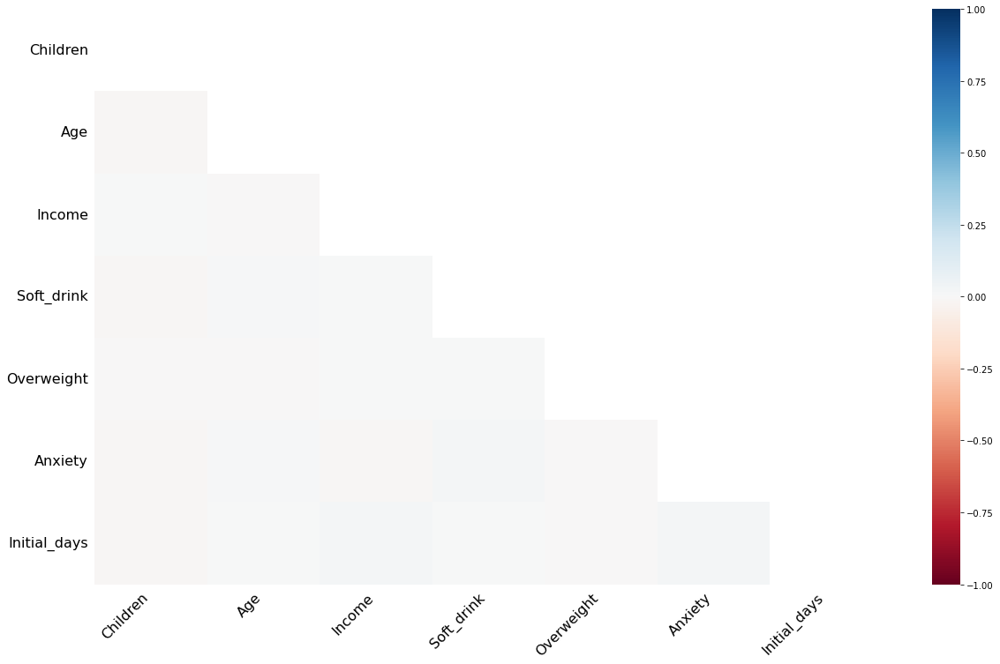

In [15]:
# DEEPER ANALYSIS OF MISSING DATA AND DETECTION OF ANY PATTERNS 
# for col in wrangled_df.columns:
#     # Soft_Drink NA Analysis 
#     missing_df = wrangled_df.sort_values(by=[col], axis=0, na_position='first')
#     msno.matrix(missing_df, fontsize=12, labels= True)
#     plt.title(col)
#     plt.show()

msno.heatmap(wrangled_df, labels = True)

# ALL MISSING DATA seems MCAR

In [16]:
# TREATMENT OF NA DATA 
# from sklearn.impute import SimpleImputer mean on numeric, most_frequent on categories
knn_imputer = KNN()
medical_df_impute = wrangled_df.copy(deep=True)
medical_df_impute.iloc[:,:] = knn_imputer.fit_transform(medical_df_impute)

medical_df_impute['Soft_drink'] = round(medical_df_impute['Soft_drink'], 0).astype(int)
medical_df_impute['Overweight'] = round(medical_df_impute['Overweight'], 0).astype(int)
medical_df_impute['Anxiety'] = round(medical_df_impute['Anxiety'], 0).astype(int)
medical_df_impute['Age'] = round(medical_df_impute['Age'], 0).astype(int)
medical_df_impute['Income'] = round(medical_df_impute['Income'], 0).astype(int)
medical_df_impute['Children'] = round(medical_df_impute['Children'], 0).astype(int)
medical_df_impute['Initial_days'] = round(medical_df_impute['Initial_days'], 0).astype(int)


Imputing row 1/10000 with 1 missing, elapsed time: 45.997
Imputing row 101/10000 with 2 missing, elapsed time: 46.014
Imputing row 201/10000 with 2 missing, elapsed time: 46.030
Imputing row 301/10000 with 0 missing, elapsed time: 46.043
Imputing row 401/10000 with 1 missing, elapsed time: 46.057
Imputing row 501/10000 with 0 missing, elapsed time: 46.072
Imputing row 601/10000 with 4 missing, elapsed time: 46.086
Imputing row 701/10000 with 1 missing, elapsed time: 46.097
Imputing row 801/10000 with 0 missing, elapsed time: 46.112
Imputing row 901/10000 with 1 missing, elapsed time: 46.128
Imputing row 1001/10000 with 2 missing, elapsed time: 46.141
Imputing row 1101/10000 with 0 missing, elapsed time: 46.155
Imputing row 1201/10000 with 3 missing, elapsed time: 46.169
Imputing row 1301/10000 with 2 missing, elapsed time: 46.184
Imputing row 1401/10000 with 1 missing, elapsed time: 46.198
Imputing row 1501/10000 with 1 missing, elapsed time: 46.215
Imputing row 1601/10000 with 1 missi

In [17]:
#ASSESSMENT OF IMPUTATION USING KNN
medical_df_impute.isna().mean()
for col in columns_with_NA:
    old_mean = wrangled_df[col].mean()
    new_mean = medical_df_impute[col].mean()
    print("Column ", col, " changed mean from ", old_mean, " to ", new_mean)
#THERE DONT SEEM TO BE ANY BIG CHANGES WHICH IS GOOD


Column  Children  changed mean from  2.0982191041554237  to  2.0877
Column  Age  changed mean from  53.29567624571579  to  53.4274
Column  Income  changed mean from  40484.44254246284  to  40606.7152
Column  Soft_drink  changed mean from  0.25806451612903225  to  0.2292
Column  Overweight  changed mean from  0.7091372809935684  to  0.7229
Column  Anxiety  changed mean from  0.3223158828748891  to  0.3121
Column  Initial_days  changed mean from  34.43269230769231  to  34.4218


In [18]:
# PERSIST THE CLEANED, WRANGLED DATASET 
medical_df_impute.to_csv('cleaned_data.csv', index=False)


In [19]:
medical_df_impute = pd.read_csv('cleaned_data.csv')
print(medical_df_impute.columns)

Index(['CaseOrder', '_Male', '_Prefer not to answer', '_Married',
       '_Never Married', '_Separated', '_Widowed', '_Suburban', '_Urban',
       '_Part Time', '_Retired', '_Student', '_Unemployed', '_CT Scan',
       '_Intravenous', '_MRI', '_Emergency Admission',
       '_Observation Admission', 'Zip', 'Lat', 'Lng', 'Population', 'Children',
       'Age', 'Education', 'Income', 'ReAdmis', 'VitD_levels', 'Doc_visits',
       'Full_meals_eaten', 'VitD_supp', 'Soft_drink', 'HighBlood', 'Stroke',
       'Complication_risk', 'Overweight', 'Arthritis', 'Diabetes',
       'Hyperlipidemia', 'BackPain', 'Anxiety', 'Allergic_rhinitis',
       'Reflux_esophagitis', 'Asthma', 'Initial_days', 'TotalCharge',
       'Additional_charges', 'Item1', 'Item2', 'Item3', 'Item4', 'Item5',
       'Item6', 'Item7', 'Item8', 'Job', 'State', 'County', 'Timezone',
       'Customer_id', 'Interaction', 'UID', 'City'],
      dtype='object')


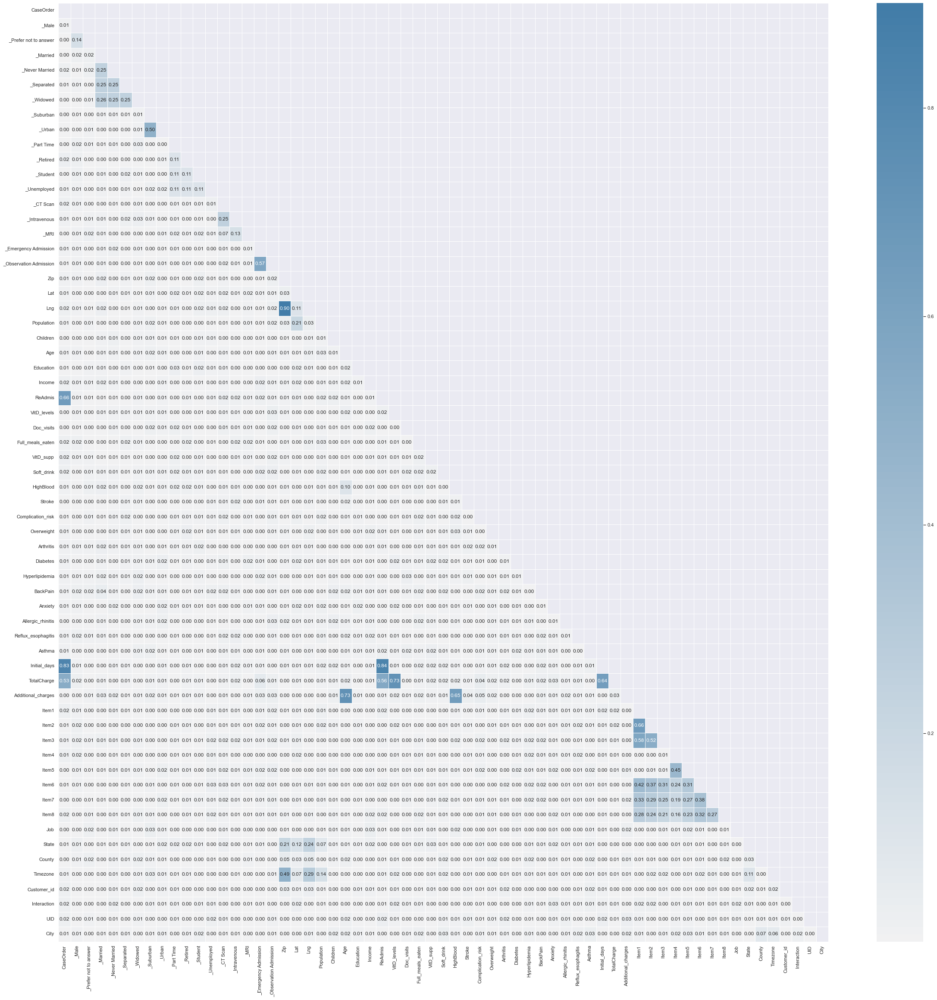

In [20]:
# DEEPER ANALYSIS OF VARIABLES AND THEIR CORRELATION 
# sns.pairplot(medical_df_impute)
sns.set(rc={'figure.figsize':(40,40)})
cmap=sns.diverging_palette(h_neg=10, h_pos=240, as_cmap=True)
mask = np.triu(np.ones_like(medical_df_impute.corr().abs(), dtype=bool))
dataset_corr = sns.heatmap(medical_df_impute.corr().abs(), mask=mask, center=0, cmap=cmap, 
                           linewidths=1, annot=True, fmt='.2f')
dataset_corr.get_figure().savefig('column_correlation.png')

medical_df_impute = medical_df_impute.drop(columns=['Zip'])

minimum  Lat  ->   17.96719
maximum  Lat  ->   70.56099
AxesSubplot(0.125,0.125;0.775x0.755)
minimum  Lng  ->   -174.20969
maximum  Lng  ->   -65.29017
AxesSubplot(0.125,0.125;0.775x0.755)
minimum  Population  ->   0.0
maximum  Population  ->   122814.0
AxesSubplot(0.125,0.125;0.775x0.755)
minimum  Children  ->   0
maximum  Children  ->   10
AxesSubplot(0.125,0.125;0.775x0.755)
minimum  Age  ->   18
maximum  Age  ->   89
AxesSubplot(0.125,0.125;0.775x0.755)
minimum  Education  ->   0.0
maximum  Education  ->   8.0
AxesSubplot(0.125,0.125;0.775x0.755)
minimum  Income  ->   154
maximum  Income  ->   207249
AxesSubplot(0.125,0.125;0.775x0.755)
minimum  VitD_levels  ->   9.519011638
maximum  VitD_levels  ->   53.01912416
AxesSubplot(0.125,0.125;0.775x0.755)
minimum  Doc_visits  ->   1.0
maximum  Doc_visits  ->   9.0
AxesSubplot(0.125,0.125;0.775x0.755)
minimum  Full_meals_eaten  ->   0.0
maximum  Full_meals_eaten  ->   7.0
AxesSubplot(0.125,0.125;0.775x0.755)
minimum  VitD_supp  ->   0.0
m

/var/folders/rl/fpvhf6bs79z4s6w15f_rjkq00000gn/T/ipykernel_52525/1564178432.py:12: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


maximum  Item7  ->   7.0
AxesSubplot(0.125,0.125;0.775x0.755)
minimum  Item8  ->   1.0
maximum  Item8  ->   7.0
AxesSubplot(0.125,0.125;0.775x0.755)
minimum  Job  ->   0.0
maximum  Job  ->   638.0
AxesSubplot(0.125,0.125;0.775x0.755)
minimum  State  ->   0.0
maximum  State  ->   51.0
AxesSubplot(0.125,0.125;0.775x0.755)
minimum  County  ->   0.0
maximum  County  ->   1606.0
AxesSubplot(0.125,0.125;0.775x0.755)
minimum  Timezone  ->   0.0
maximum  Timezone  ->   25.0
AxesSubplot(0.125,0.125;0.775x0.755)
minimum  City  ->   0.0
maximum  City  ->   6071.0
AxesSubplot(0.125,0.125;0.775x0.755)


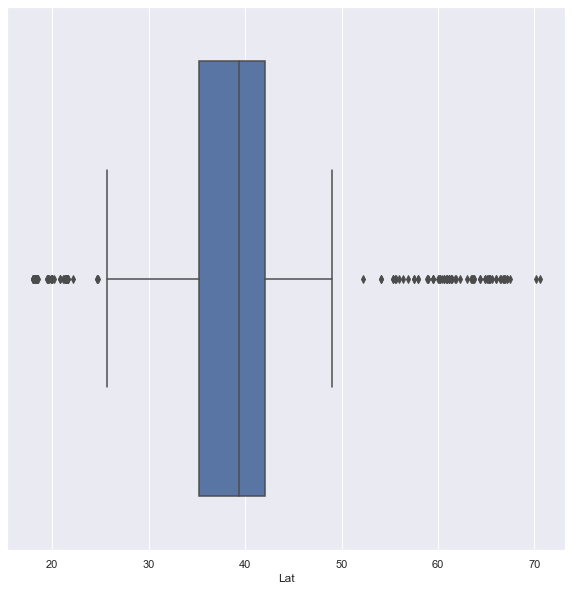

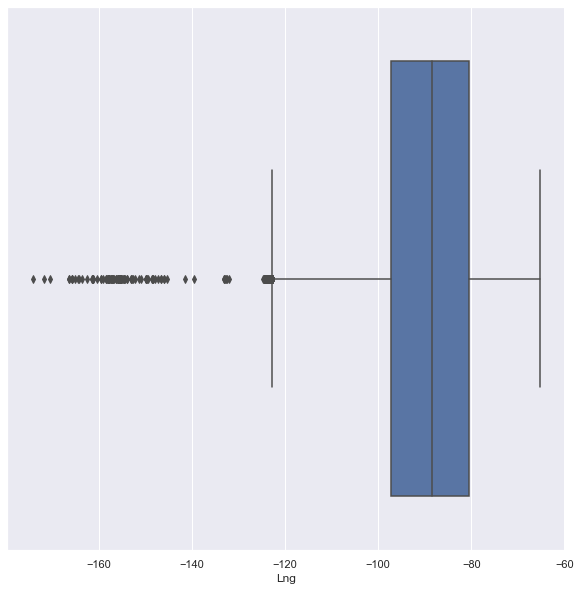

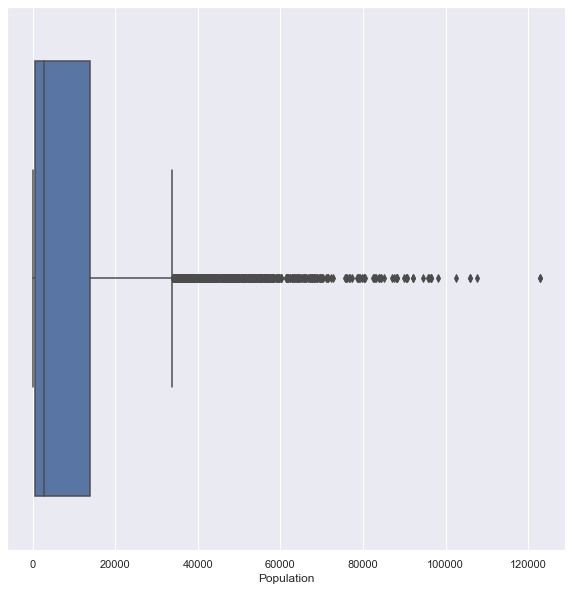

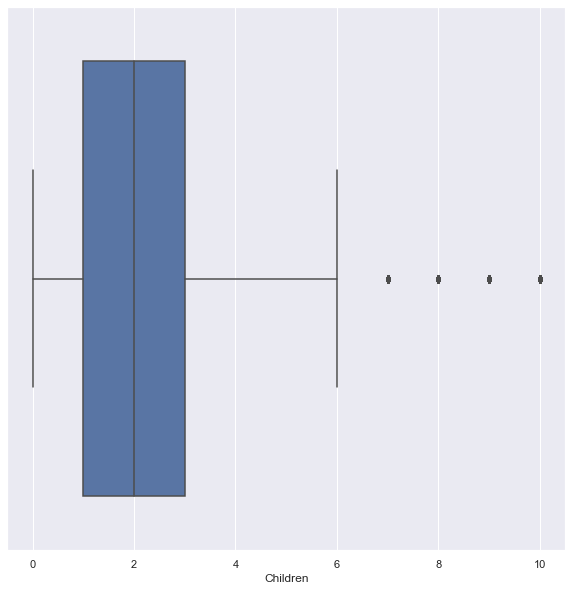

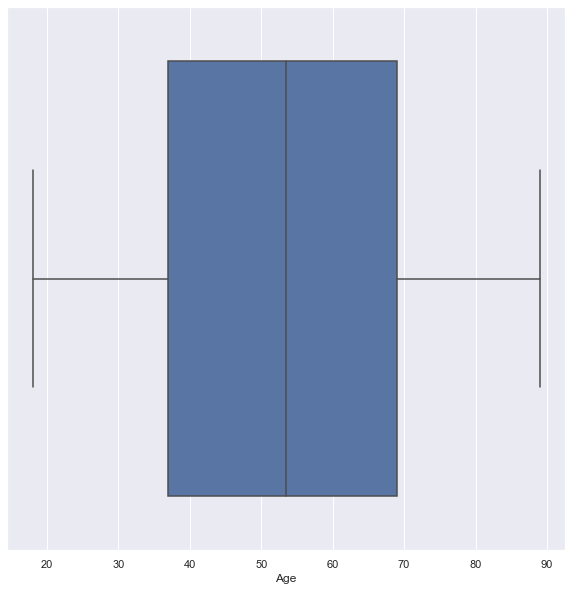

...

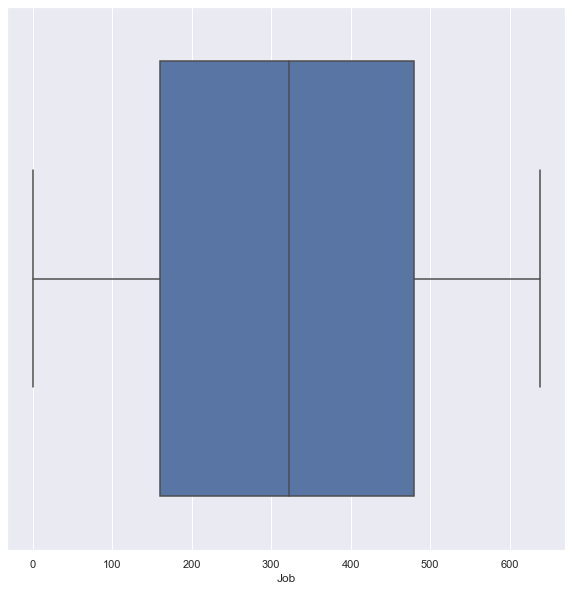

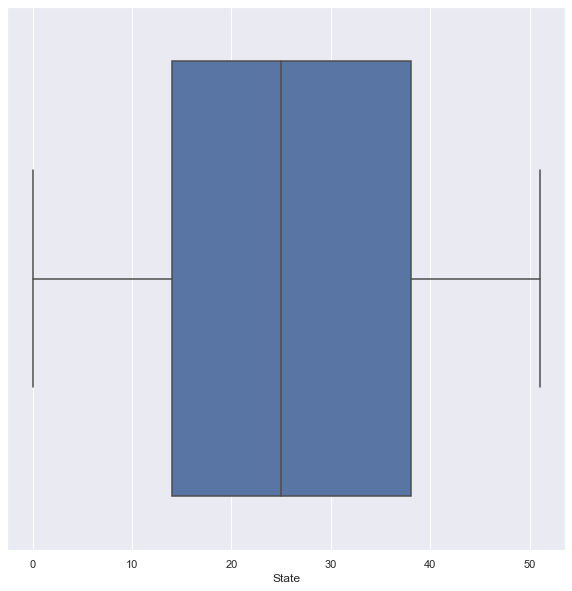

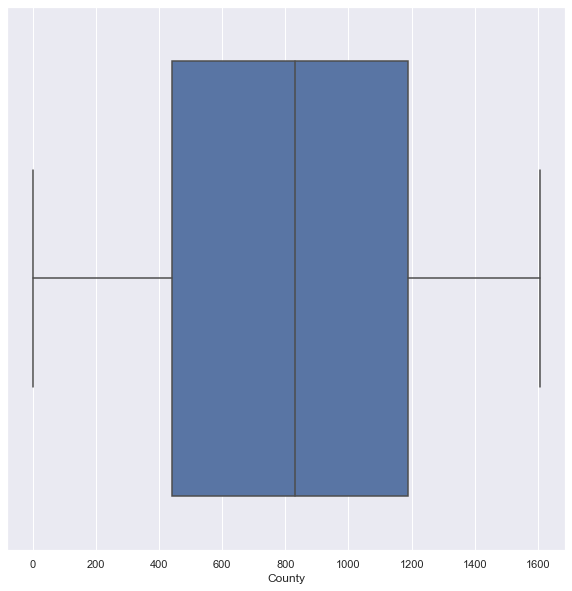

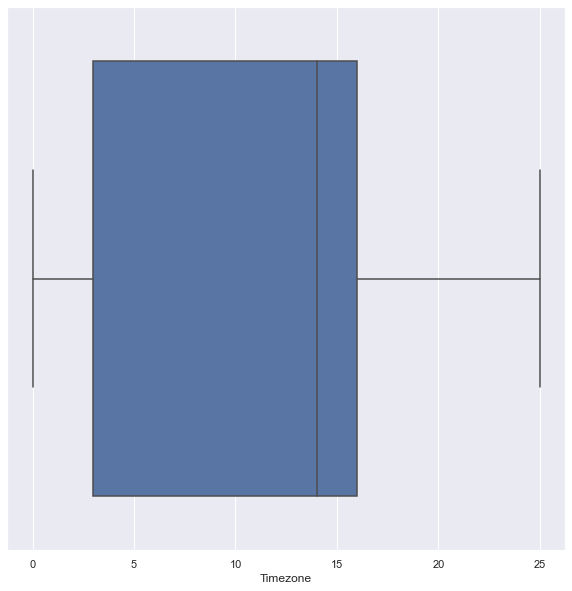

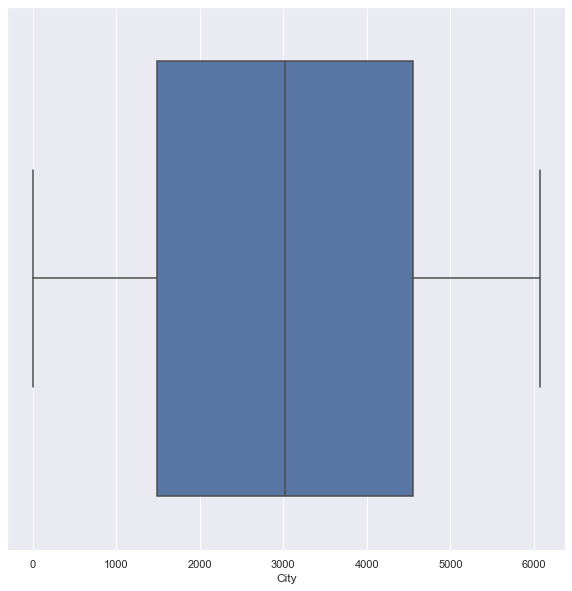

<Figure size 720x720 with 0 Axes>

In [21]:
# OUTLIER DETECTION
columns_pool = [col for col in medical_df_impute.columns if not col.startswith("_")]
irrelevant_col = {'CaseOrder', 'Customer_id', 'Interaction', 'UID','Soft_drink', 'HighBlood','Stroke','Complication_risk', 'Overweight', 'ReAdmis', 'Arthritis', 'Diabetes', 'Hyperlipidemia', 'BackPain', 'Anxiety', 'Allergic_rhinitis', 'Reflux_esophagitis', 'Asthma'}
columns_pool = [col for col in columns_pool if col not in irrelevant_col]
# print(columns_pool)
sns.set(rc={'figure.figsize':(10,10)})
for col in columns_pool:
    # expose any data that is an outlier
    print("minimum ", col, " ->  ", medical_df_impute[col].min())
    print("maximum ", col, " ->  ", medical_df_impute[col].max())
    boxplot = sns.boxplot(x = col, data = medical_df_impute)
    plt.figure()
    print(boxplot)

# NO EVIDENCE OF ANY DUPLICATES !

In [22]:
# PCA 

# a  SEPARATE DATA INTO categorical AND continuous 
# b  PCA Model 
#         * analysis against categories using Pipe 
# c  Selection of PCs

In [23]:
# BEFORE PCA, split dataset into categorical and non-categorical data 

medical_cat_df = medical_df_impute[['_Male', '_Prefer not to answer', '_Married', '_Never Married',
                                    '_Separated', '_Widowed', '_Suburban', '_Urban', '_Part Time', '_Retired',
                                    '_Student', '_Unemployed', '_CT Scan', '_Intravenous', '_MRI', '_Emergency Admission', 
                                    '_Observation Admission', 'ReAdmis', 'Soft_drink', 'HighBlood', 'Stroke', 'Complication_risk', 
                                    'Overweight', 'Arthritis', 'Diabetes', 'Hyperlipidemia', 'BackPain', 'Anxiety', 'Timezone',
                                    'Allergic_rhinitis','Reflux_esophagitis', 'Asthma', 'State', 'City', 'County', 'Job', 
                                    'Education', 'Item1', 'Item2', 'Item3', 'Item4', 'Item5', 'Item6', 'Item7', 'Item8' ]]
numeric_cols = [ col for col in medical_df_impute.columns if col not in list(medical_cat_df.columns) + ['CaseOrder', 'Interaction', 'Customer_id', 'UID']]
medical_cont_df = medical_df_impute[numeric_cols]
print(medical_cont_df.columns)

Index(['Lat', 'Lng', 'Population', 'Children', 'Age', 'Income', 'VitD_levels',
       'Doc_visits', 'Full_meals_eaten', 'VitD_supp', 'Initial_days',
       'TotalCharge', 'Additional_charges'],
      dtype='object')


In [25]:
# NORMALIZE Data to improve PCA perform.
df_std = (medical_cont_df - medical_cont_df.mean())/ medical_cont_df.std()
pca = PCA(n_components = df_std.shape[1])  # 0.9.    or medical_cont_df.shape[1]
pca.fit_transform(df_std)

columns_gen_2 = ['PC'+ str(x) for x in range(1,len(df_std.columns)+1)]
print(pca.explained_variance_ratio_.cumsum())
loadings = pd.DataFrame( pca.components_.T, columns = columns_gen_2, index = medical_cont_df.columns )
print(loadings)

[0.15270758 0.28562933 0.38003779 0.46028718 0.5390726  0.61751912
 0.69452158 0.77045525 0.84496823 0.91934982 0.97680439 0.99731833
 1.        ]
                         PC1       PC2       PC3       PC4       PC5  \
Lat                -0.018946  0.004619 -0.714287  0.124864 -0.070932   
Lng                -0.004894  0.016454  0.268567 -0.671915 -0.214371   
Population          0.020921 -0.037106  0.629698  0.315623  0.112016   
Children            0.017627  0.016782  0.016085  0.352590  0.159814   
Age                 0.123257  0.695139  0.011517  0.001087 -0.021492   
Income             -0.010161 -0.013086  0.077904  0.258162  0.377432   
VitD_levels         0.523445 -0.081774 -0.045977 -0.196833  0.274732   
Doc_visits         -0.002466  0.016786  0.017466  0.182887  0.134374   
Full_meals_eaten   -0.006892  0.034880 -0.100262 -0.180696  0.672599   
VitD_supp           0.030718  0.008097  0.032558  0.311390 -0.368933   
Initial_days        0.459974 -0.098611  0.018230  0.198192 -0

/var/folders/rl/fpvhf6bs79z4s6w15f_rjkq00000gn/T/ipykernel_52525/1405958464.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  medical_cat_df['PC1'] = pc[:,0]
/var/folders/rl/fpvhf6bs79z4s6w15f_rjkq00000gn/T/ipykernel_52525/1405958464.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  medical_cat_df['PC2'] = pc[:,1]
/var/folders/rl/fpvhf6bs79z4s6w15f_rjkq00000gn/T/ipykernel_52525/1405958464.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[r

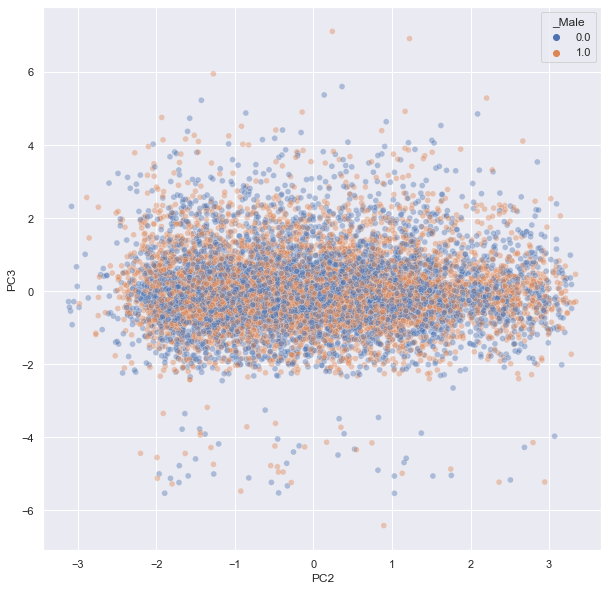

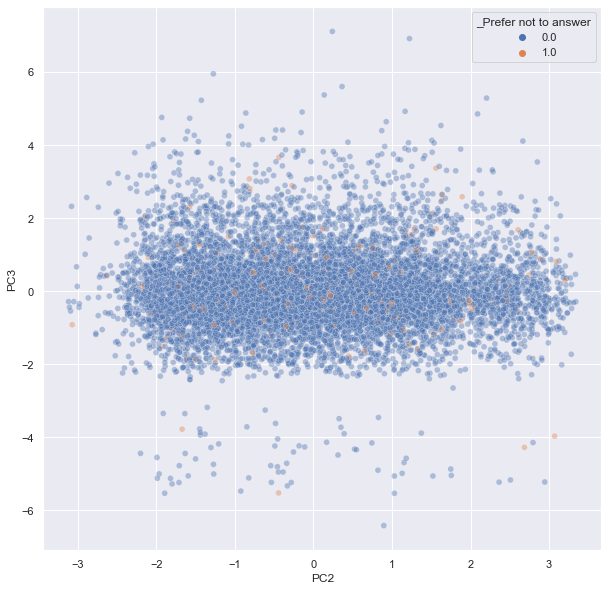

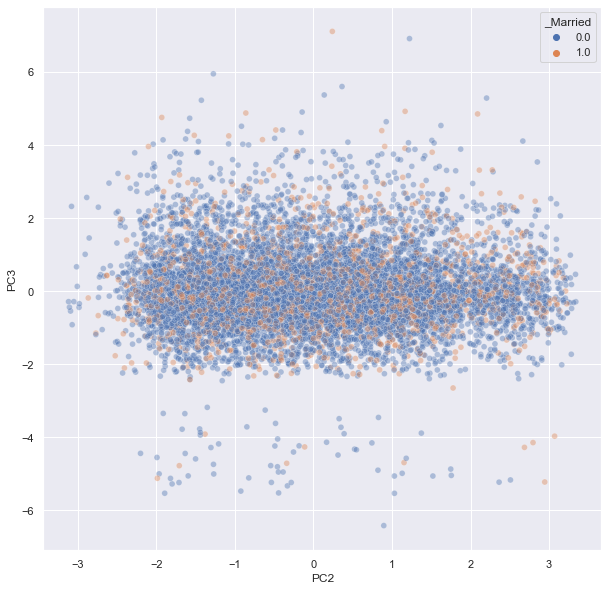

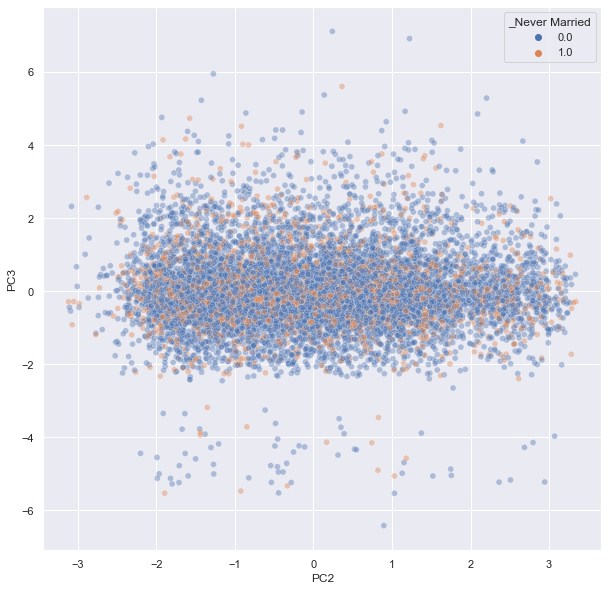

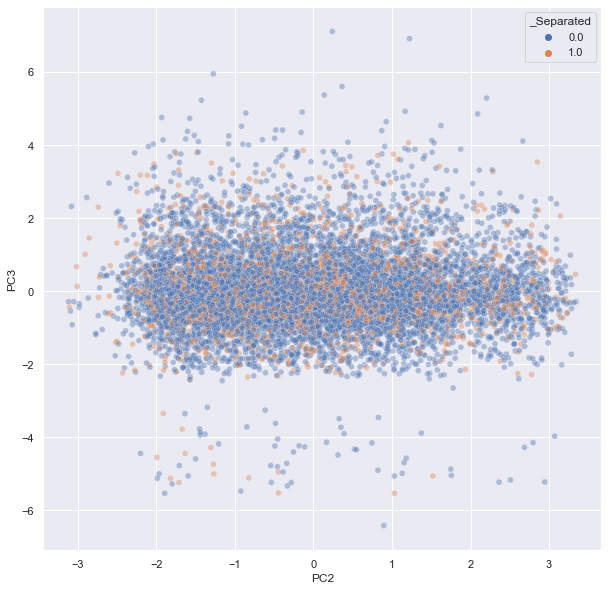

...

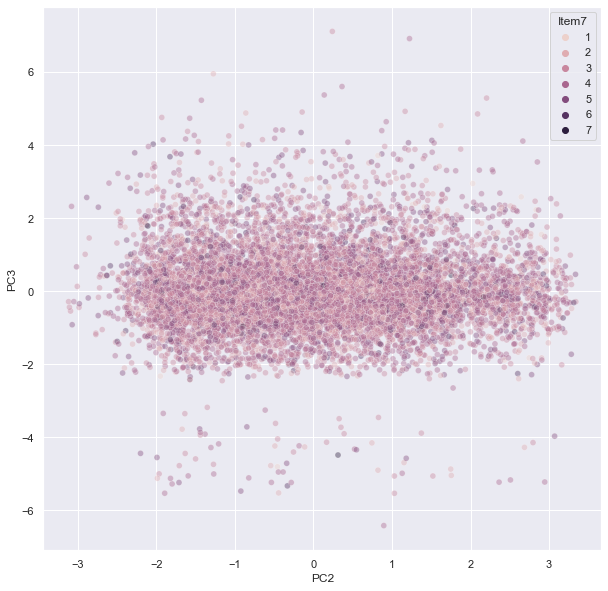

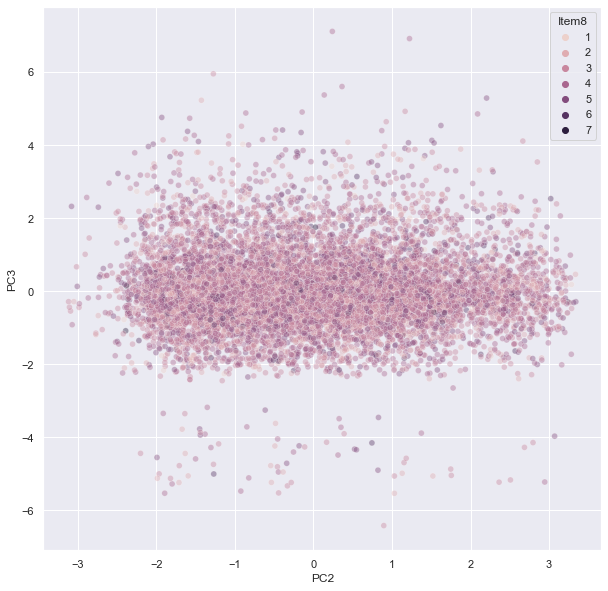

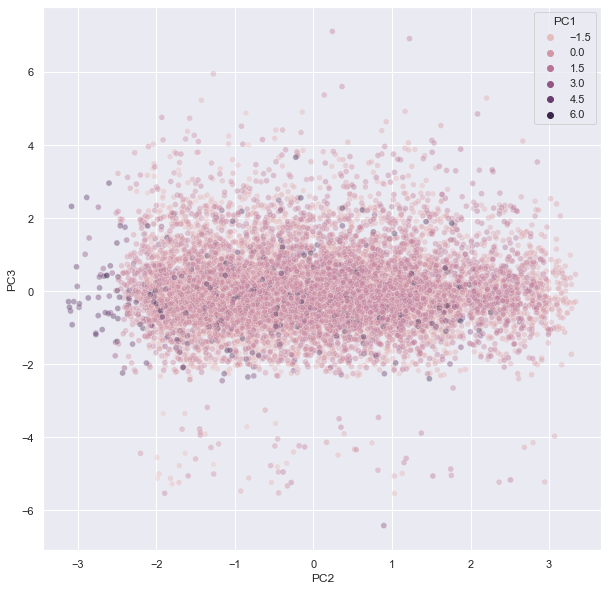

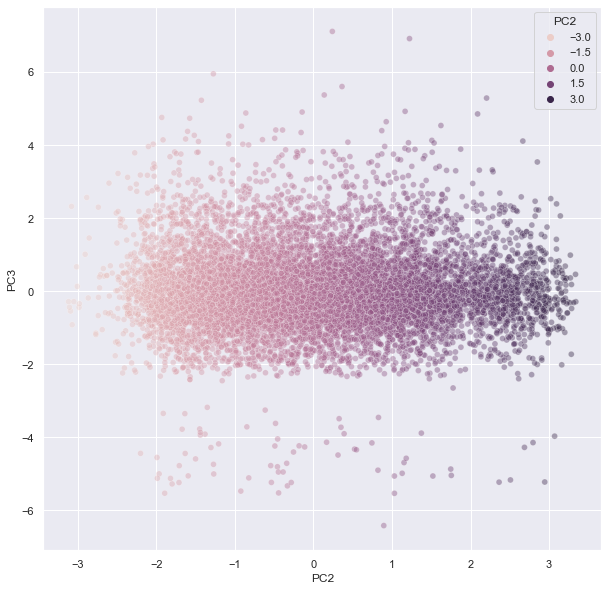

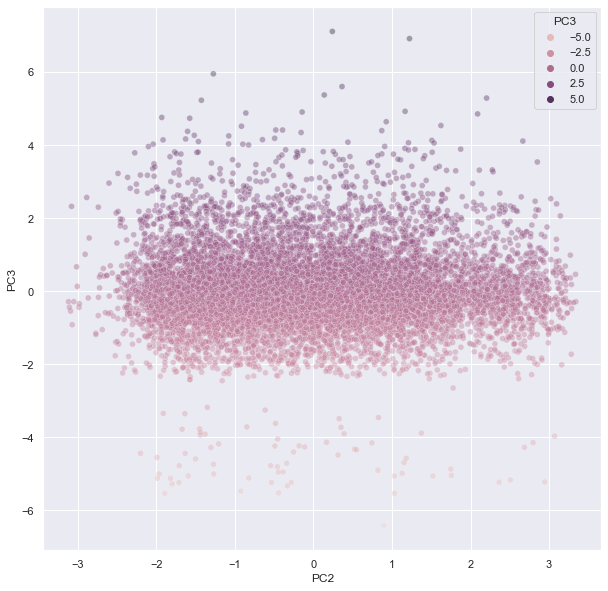

In [29]:
# Build the pipeline
pipe = Pipeline([
    ('scaler', StandardScaler()),
    ('reducer', PCA(n_components=medical_cont_df.shape[1]))
])

# Fit it to the dataset and extract the component vectors
pc = pipe.fit_transform(medical_cont_df)
medical_cat_df['PC1'] = pc[:,0]
medical_cat_df['PC2'] = pc[:,1]
medical_cat_df['PC3'] = pc[:,2]

for i in medical_cat_df.columns:
    plt.figure()
    sns.scatterplot(data=medical_cat_df, x='PC1', y='PC2', hue= i, alpha=0.4)
# Interesting ReAdmis, High Blood

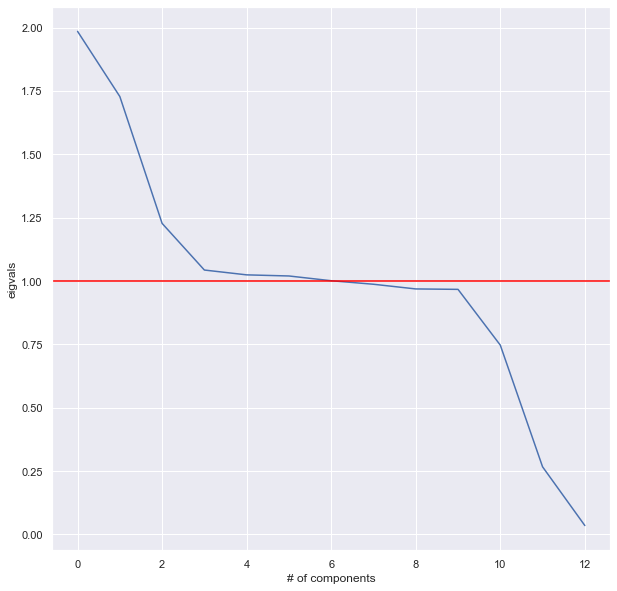

In [267]:
# IDENTIFY COMPONETS TO KEEP 
cov_matrix = np.dot(df_std.T, df_std) / medical_cont_df.shape[0]
eigenvals = [np.dot(eigv.T, np.dot(cov_matrix, eigv)) for eigv in pca.components_]
plt.plot(eigenvals)
plt.xlabel("# of components")
plt.ylabel("eigvals")
plt.axhline(y=1, color="red")
plt.show()

# eigenvalue = strength of transformation in the direction of eigenvecotr

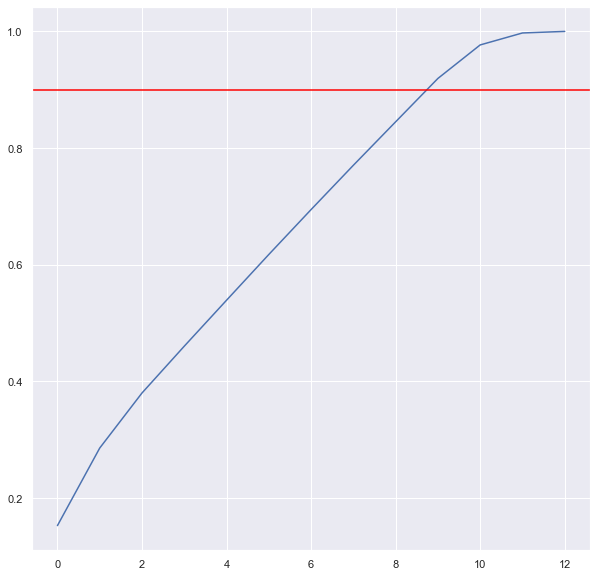

In [270]:
plt.plot(pipe['reducer'].explained_variance_ratio_.cumsum())
plt.axhline(y=0.9, color="red")
plt.show()